- bollard , 공유킥보드 학습(474)
- train : validation : test = 331 : 94 : 49




In [1]:
import yaml
import torch
from IPython.display import Image, clear_output

In [2]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 12123, done.
remote: Counting objects: 100% (76/76), done.
remote: Compressing objects: 100% (49/49), done.
remote: Total 12123 (delta 41), reused 57 (delta 27), pack-reused 12047
Receiving objects: 100% (12123/12123), 12.56 MiB | 21.95 MiB/s, done.
Resolving deltas: 100% (8334/8334), done.


In [3]:
%cd yolov5

/content/yolov5


In [4]:
%pip install -qr requirements.txt

     |████████████████████████████████| 1.6 MB 4.3 MB/s 


In [5]:
print(f"Torch: {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'}")

Torch: 1.12.1+cu113 (Tesla P100-PCIE-16GB


- roboflow의 bollard + electricscooter dataset 가져와서 학습 시키기


In [6]:
%mkdir /content/yolov5/bolles
%cd /content/yolov5/bolles

!curl -L "https://app.roboflow.com/ds/gZKvoqL2op?key=lTWGUFoW75" > bolles.zip; unzip bolles.zip;

/content/yolov5/bolles
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   893  100   893    0     0    409      0  0:00:02  0:00:02 --:--:--   409
100 15.7M  100 15.7M    0     0  3576k      0  0:00:04  0:00:04 --:--:-- 14.1M
Archive:  bolles.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/113_jpg.rf.7d443b49c94404b1317086e892744867.jpg  
 extracting: test/images/114_jpg.rf.26cbba82bd93a46d301bc24e67899bf9.jpg  
 extracting: test/images/130_jpg.rf.35a9e56f6184b5643f682d7322040c6b.jpg  
 extracting: test/images/139_jpg.rf.3803bda9d3ff436650fcc304c76c08fa.jpg  
 extracting: test/images/141_jpg.rf.a59d78cb27c6ff0d8dad920ca77e4de1.jpg  
 extracting: test/images/165_jpg.rf.a62d4699da98166d1a7d4e11e3faf137.jpg  
 extracting: test/images/179_jp

In [7]:
from glob import glob

train_img_list = glob('/content/yolov5/bolles/train/images/*.jpg')
test_img_list = glob('/content/yolov5/bolles/test/images/*.jpg')
valid_img_list = glob('/content/yolov5/bolles/valid/images/*.jpg')

print(len(train_img_list),len(test_img_list),len(valid_img_list))

331 49 94


In [8]:
import yaml

with open('/content/yolov5/bolles/train.txt', 'w') as f:
  f.write('\n'.join(train_img_list) + '\n')

with open('/content/yolov5/bolles/test.txt', 'w') as f:
  f.write('\n'.join(train_img_list) + '\n')

with open('/content/yolov5/bolles/val.txt', 'w') as f:
  f.write('\n'.join(train_img_list) + '\n')

In [9]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line,cell):
  with open(line, 'w') as f:
    f.write(cell.format(**globals()))

In [10]:
%cat /content/yolov5/bolles/data.yaml

train: ../train/images
val: ../valid/images

nc: 2
names: ['bollard', 'electricscooter']

In [11]:
%%writetemplate /content/yolov5/bolles/data.yaml

train: ./bolles/train/images
test: ./bolles/test/images
val: ./bolles/valid/images

nc: 2
names: ['bollard', 'electricscooter']

In [12]:
%cat /content/yolov5/bolles/data.yaml


train: ./bolles/train/images
test: ./bolles/test/images
val: ./bolles/valid/images

nc: 2
names: ['bollard', 'electricscooter']


# 모델구성

In [13]:
import yaml

with open("/content/yolov5/bolles/data.yaml",'r') as stream:
  num_classes = str(yaml.safe_load(stream)['nc'])

%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [14]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# Parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]


In [15]:
%cat /content/yolov5/models/custom_yolov5s.yaml


# Parameters
nc: 2  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, Fa

# 학습(Training)
- img : 입력 이미지 크기 정의
- batch : 배치 크기 결정
- epochs : 학습 기간 개수 정의
- data : 모델 구성 지정
- weights : 가중치에 대한 경로 지정
- name : 결과 이름
- nosave : 최종 체크포인트만 저장
- cache : 빠른 학습을 위한 이미지 캐시

In [16]:
%%time
%cd /content/yolov5/

!python train.py --img 640 --batch 32 --epochs 500 --data ./bolles/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name es_results --cache ram

/content/yolov5
train: weights=, cfg=./models/custom_yolov5s.yaml, data=./bolles/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=500, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=es_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-73-g91a81d4 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anch

# 학습이 잘 되었는지 tensorboard로 확인

In [17]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

## 결과물 확인

In [18]:
!ls /content/yolov5/runs/train/es_results/

confusion_matrix.png				   results.csv
events.out.tfevents.1661845076.2c576c12c749.230.0  results.png
F1_curve.png					   train_batch0.jpg
hyp.yaml					   train_batch1.jpg
labels_correlogram.jpg				   train_batch2.jpg
labels.jpg					   val_batch0_labels.jpg
opt.yaml					   val_batch0_pred.jpg
P_curve.png					   val_batch1_labels.jpg
PR_curve.png					   val_batch1_pred.jpg
R_curve.png					   weights


## 학습한 결과 확인

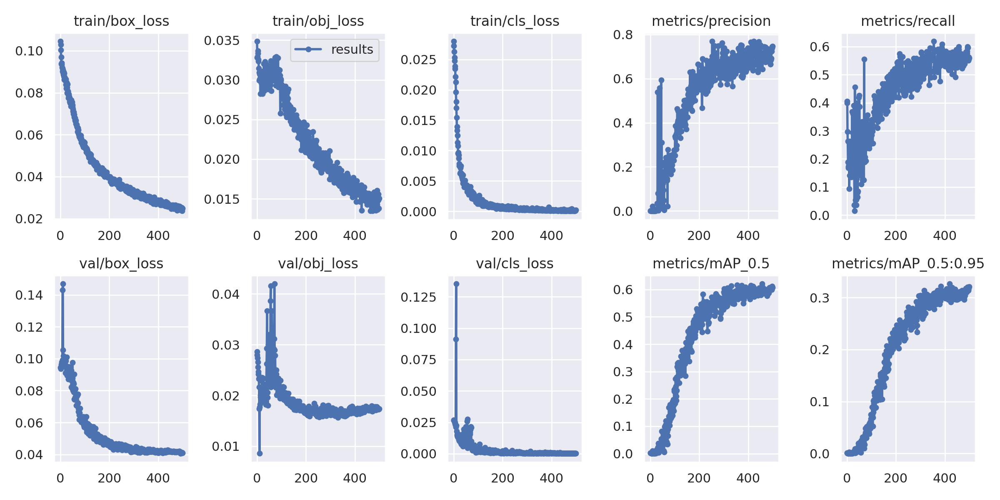

In [19]:
Image(filename='/content/yolov5/runs/train/es_results/results.png',width=1000)

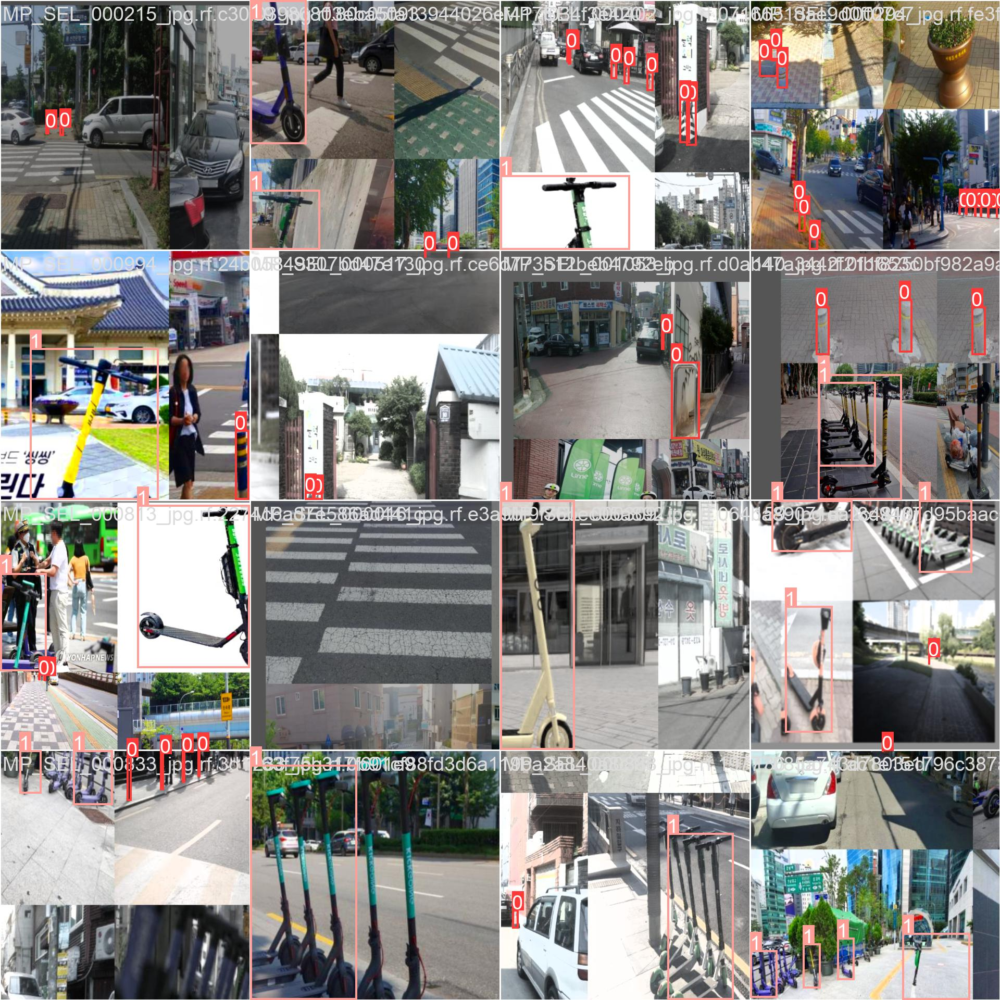

In [20]:
Image(filename='/content/yolov5/runs/train/es_results/train_batch0.jpg',width=1000) # train에서 사용한 이미지들에서 찾은 결과

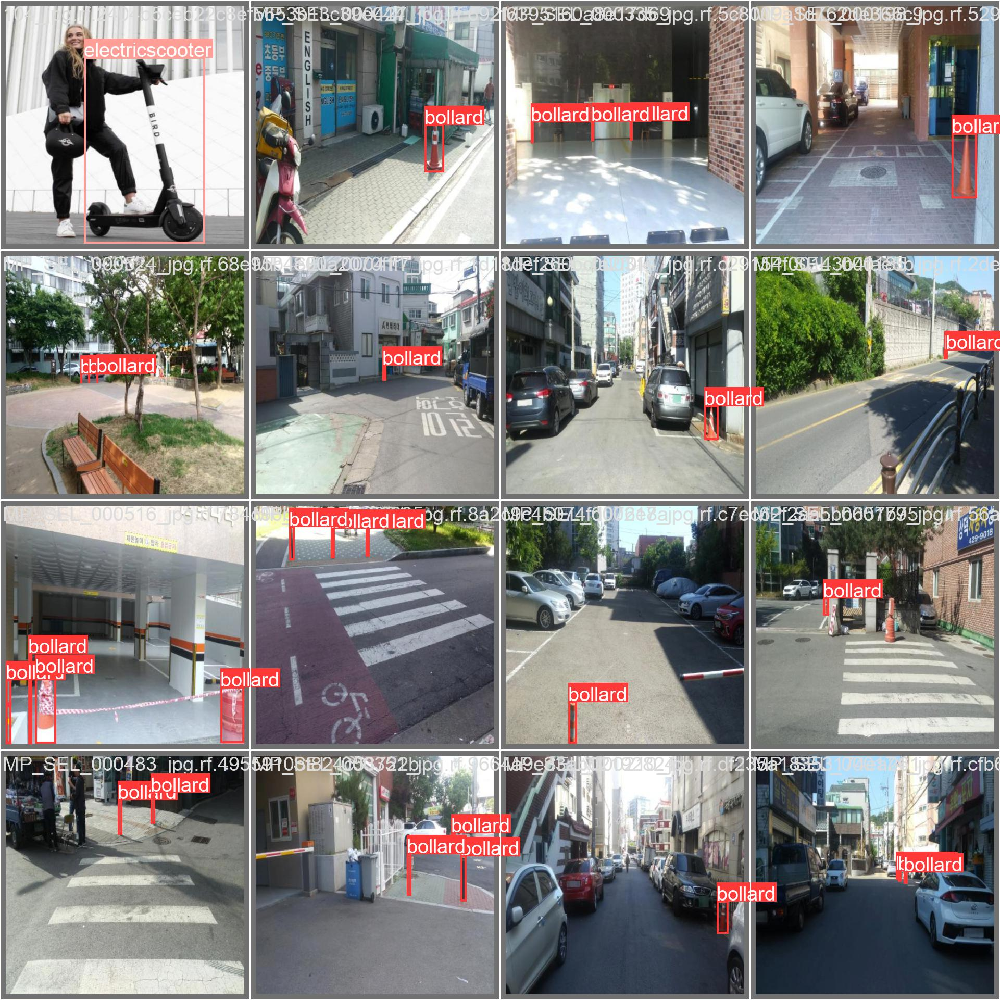

In [21]:
Image(filename='/content/yolov5/runs/train/es_results/val_batch0_labels.jpg',width=1000) # validation 결과 label 붙여서 보여줌

# 검증(Validation)

In [22]:
%cd /content/yolov5

/content/yolov5


In [23]:
!python val.py --weights runs/train/es_results/weights/best.pt --data ./bolles/data.yaml --img 640 --iou 0.65 --half 

val: data=./bolles/data.yaml, weights=['runs/train/es_results/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.65, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v6.2-73-g91a81d4 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
custom_YOLOv5s summary: 213 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning '/content/yolov5/bolles/valid/labels.cache' images and labels... 94 found, 0 missing, 0 empty, 0 corrupt: 100% 94/94 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R     mAP@.5 mAP@.5:.95: 100% 3/3 [00:03<00:00,  1.02s/it]
                   all         94        239      0.631      0.577      0.607      0.326
               bollard         94        165      0.576      0.533      0.499      0.22

In [ ]:
%cd /content/yolov5

/content/yolov5


In [24]:
!python val.py --weights runs/train/es_results/weights/best.pt --data ./bolles/data.yaml --img 640 --task test # test로 수행

val: data=./bolles/data.yaml, weights=['runs/train/es_results/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.2-73-g91a81d4 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
custom_YOLOv5s summary: 213 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
test: Scanning '/content/yolov5/bolles/test/labels' images and labels...49 found, 0 missing, 0 empty, 0 corrupt: 100% 49/49 [00:00<00:00, 555.88it/s]
test: New cache created: /content/yolov5/bolles/test/labels.cache
                 Class     Images  Instances          P          R     mAP@.5 mAP@.5:.95: 100% 2/2 [00:01<00:00,  1.15it/s]
                   all         49        126       0.63       0.51      0.527      0.276
               bol

# 추론(Inference)

In [25]:
%ls runs/train/es_results/weights

best.pt  last.pt


In [26]:
!python detect.py --weights runs/train/es_results/weights/best.pt --img 640 --conf 0.4 --source ./bolles/test/images # test 이미지에 대해 detection

detect: weights=['runs/train/es_results/weights/best.pt'], source=./bolles/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.2-73-g91a81d4 Python-3.7.13 torch-1.12.1+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
custom_YOLOv5s summary: 213 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/49 /content/yolov5/bolles/test/images/113_jpg.rf.7d443b49c94404b1317086e892744867.jpg: 640x640 (no detections), 6.0ms
image 2/49 /content/yolov5/bolles/test/images/114_jpg.rf.26cbba82bd93a46d301bc24e67899bf9.jpg: 640x640 3 electricscooters, 6.0ms
image 3/49 /content/yolov5/bolles/test/images/130_jpg.rf.35a9e56f6184b5643f682

## 결과를 random하게 보기

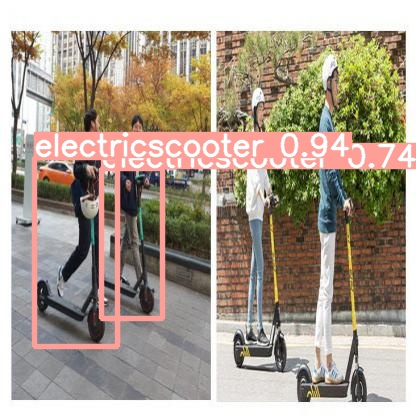

In [47]:
import glob
import random
from IPython.display import Image, display

image_name = random.choice(glob.glob('/content/yolov5/runs/detect/exp/*.jpg'))
display(Image(filename=image_name))

# 모델 내보내기

In [48]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [49]:
%cp /content/yolov5/runs/train/es_results/weights/best.pt /content/gdrive/MyDrive/yolov5_sidewalk/best_boallard_es_500.pt